# Class Based Analysis of Uncertainty Heatmaps

In this notebook we apply class based metrics to uncertainty heatmaps using given (predicted) segmentation masks.

In [16]:
# Firstly, we import necessary packages
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

from aggrigator.uncertainty_maps import UncertaintyMap
from aggrigator.methods import AggregationMethods as am
from aggrigator.summary import AggregationSummary
from aggrigator.strategylist import StrategyList
from aggrigator.util import generate_disk_bdry_mask, generate_disk_mask
from aggrigator.datasets import generate_binary_quadrant_array, generate_checkerboard_array

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Data

In [17]:
path = os.path.join(os.getcwd(), "data", "arctique_uq_maps")
filenames = os.listdir(path)
filenames

['instance_noise_0_blood_cells_0_00_dropout_au.npy',
 'instance_noise_0_blood_cells_0_00_dropout_eu.npy',
 'instance_noise_0_blood_cells_0_00_dropout_pu.npy',
 'instance_noise_0_blood_cells_0_00_ensemble_au.npy',
 'instance_noise_0_blood_cells_0_00_ensemble_eu.npy',
 'instance_noise_0_blood_cells_0_00_ensemble_pu.npy',
 'instance_noise_0_blood_cells_0_00_softmax_pu.npy',
 'instance_noise_0_blood_cells_0_00_tta_au.npy',
 'instance_noise_0_blood_cells_0_00_tta_eu.npy',
 'instance_noise_0_blood_cells_0_00_tta_pu.npy',
 'instance_noise_0_blood_cells_0_25_dropout_au.npy',
 'instance_noise_0_blood_cells_0_25_dropout_eu.npy',
 'instance_noise_0_blood_cells_0_25_dropout_pu.npy',
 'instance_noise_0_blood_cells_0_25_ensemble_au.npy',
 'instance_noise_0_blood_cells_0_25_ensemble_eu.npy',
 'instance_noise_0_blood_cells_0_25_ensemble_pu.npy',
 'instance_noise_0_blood_cells_0_25_softmax_pu.npy',
 'instance_noise_0_blood_cells_0_25_tta_au.npy',
 'instance_noise_0_blood_cells_0_25_tta_eu.npy',
 'insta

In [14]:
import tifffile as tiff

TO_INTENSITY = {
    '1_00': '0_00',
    '0_75': '0_175',
    '0_50' : '0_35', 
    '0_25': '0_525',
    '0_00': '0_70'
}

root = r"C:\Users\ckarg\Documents\Datasets\Arctique\variations"
types = ["blood_cells", "nuclei_intensity"]
levels = ["0_00", "0_25", "0_50", "0_75", "1_00"]
tasks = ["semantic", "instance"]

mask_paths = []
for type in types:
    for level in levels:
        for task in tasks:
            conv_level = level if type=="blood_cells" else TO_INTENSITY[level]
            mask_path = os.path.join(root, type, conv_level, "masks", f"{task}_indexing")
            mask_paths.append(mask_path)
            filenames = os.listdir(mask_path)

            # Read TIFF files and convert to NumPy arrays
            img_arrays = []
            for file in filenames:
                img_path = os.path.join(mask_path, file)
                img = tiff.imread(img_path)

                # Ensure the image is 2D
                assert img.ndim == 2, f"Image {file} is not 2D, but has shape {img.shape}"

                img_arrays.append(img)

            # Stack all 2D arrays into a single 3D NumPy array
            stacked_array = np.stack(img_arrays, axis=0)
            print(stacked_array.shape)

            # Define output filename
            output_filename = os.path.join("data", "arctique_masks", f"{task}_noise_0_{type}_{level}_mask.npy")

            # # Save as .npy file
            np.save(output_filename, stacked_array)





(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)
(50, 512, 512)


In [20]:
def heatmap_name_to_mask(filename):
    split = filename.split('_')[:-2]
    return '_'.join(split) + "_mask.npy"

heatmap_name_to_mask(filenames[0])

'instance_noise_0_blood_cells_0_00_mask.npy'

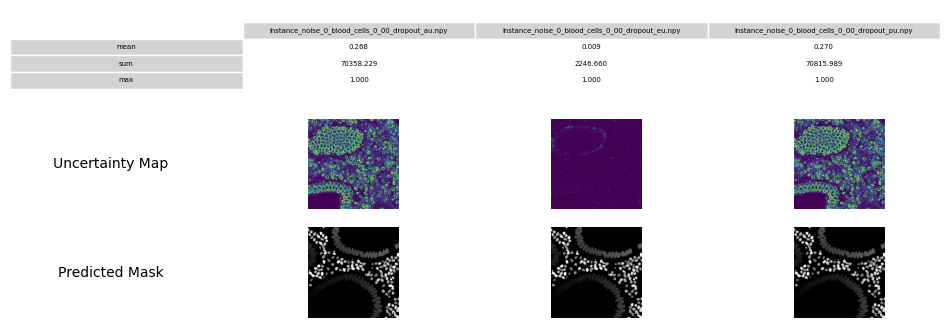

In [32]:
slice = 25
heatmap_path = os.path.join(os.getcwd(), "data", "arctique_uq_maps")
mask_path = os.path.join(os.getcwd(), "data", "arctique_masks")

arrays = [np.load(os.path.join(heatmap_path, file)) for file in filenames]
arrays = [array[slice,:,:] for array in arrays]
arrays = [np.where(array < 0, 0, array) for array in arrays]
masks = [np.load(os.path.join(mask_path, heatmap_name_to_mask(file))) for file in filenames]
masks = [mask[slice,:,:] for mask in masks]

strategy_list = StrategyList.BASIC
summary = AggregationSummary(strategy_list)
unc_maps = [UncertaintyMap(array=array, mask=mask, name=name) for array, mask, name in zip(arrays, masks, filenames)]
result = summary.apply_methods(unc_maps[:3], save_to_excel=False, do_plot=True, max_value=1.0)

In [31]:

# Check for invalid values
if np.any(np.isnan(arrays[0])) or np.any(np.isinf(arrays[0])):
    raise ValueError("Array contains NaN or infinite values. Please check the input.")

print(np.sum(arrays[0], dtype=np.float64))  # If this works, float64 overflowed

np.max(arrays[0])

70358.2286092639


np.float16(1.0)

## Basic Example

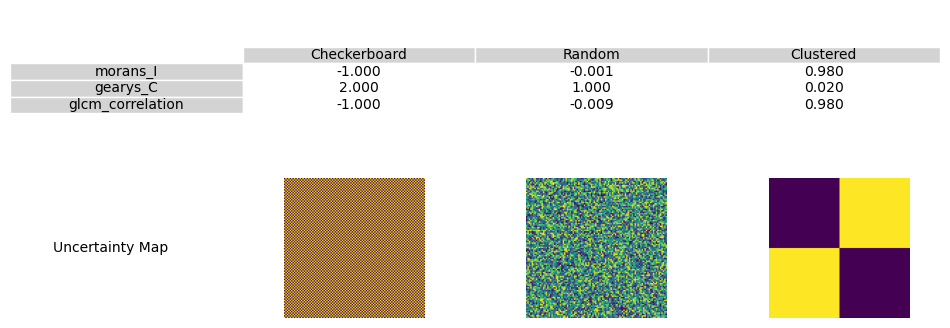

In [75]:
size = 100
array_1 = generate_checkerboard_array(size)
unc_map_1 = UncertaintyMap(array=array_1, mask=None, name="Checkerboard")

array_2 = np.random.random((100,100))
unc_map_2 = UncertaintyMap(array=array_2, mask=None, name="Random")

array_3 = generate_binary_quadrant_array(size)
unc_map_3 = UncertaintyMap(array=array_3, mask=None, name="Clustered")

summary = AggregationSummary(StrategyList.SPATIAL)
result = summary.apply_methods([unc_map_1, unc_map_2, unc_map_3], save_to_excel=False, do_plot=True, max_value=1.0)

# Analysis of Arctique Heatmaps

In [209]:
def get_arctique_slice_arrays(slice, dataset):
    # Load arrays
    path = os.path.join(os.getcwd(), "data", dataset)
    files = os.listdir(path)
    arrays = [np.load(os.path.join(path, file)) for file in files] # 3D arrays, shape (50,512,512)
    arrays = [array[slice,:,:] for array in arrays]
    arrays = [np.where(array < 0, 0, array) for array in arrays]
    return arrays, files

In [213]:
# Get spatial aggregation summary (load if availabele otherwise generate it)

SLICE = 25
DATASET = "arctique_uq_maps"

arrays, filenames = get_arctique_slice_arrays(SLICE, DATASET)

file_path = f"output/spatial_analysis_{DATASET}_slice_{SLICE}_results.xlsx"
if os.path.exists(file_path):
    spatial_df = pd.read_excel(file_path)
else:
    # Compute new results
    unc_maps = [UncertaintyMap(array=array, mask=None, name=name) for array, name in zip(arrays, filenames)]
    strategy_list = StrategyList.SPATIAL + [(am.mean, None)]
    summary = AggregationSummary(strategy_list, name=f"spatial_analysis_{DATASET}_slice_{SLICE}", num_cpus=12)
    spatial_df = summary.apply_methods(unc_maps, save_to_excel=True, do_plot=False, max_value=1.0)

spatial_df

,Unnamed: 0,Name,instance_noise_0_blood_cells_0_00_dropout_au.npy,instance_noise_0_blood_cells_0_00_dropout_eu.npy,instance_noise_0_blood_cells_0_00_dropout_pu.npy,instance_noise_0_blood_cells_0_00_ensemble_au.npy,instance_noise_0_blood_cells_0_00_ensemble_eu.npy,instance_noise_0_blood_cells_0_00_ensemble_pu.npy,instance_noise_0_blood_cells_0_00_softmax_pu.npy,instance_noise_0_blood_cells_0_00_tta_au.npy,...,semantic_noise_0_nuclei_intensity_1_00_dropout_au.npy,semantic_noise_0_nuclei_intensity_1_00_dropout_eu.npy,semantic_noise_0_nuclei_intensity_1_00_dropout_pu.npy,semantic_noise_0_nuclei_intensity_1_00_ensemble_au.npy,semantic_noise_0_nuclei_intensity_1_00_ensemble_eu.npy,semantic_noise_0_nuclei_intensity_1_00_ensemble_pu.npy,semantic_noise_0_nuclei_intensity_1_00_softmax_pu.npy,semantic_noise_0_nuclei_intensity_1_00_tta_au.npy,semantic_noise_0_nuclei_intensity_1_00_tta_eu.npy,semantic_noise_0_nuclei_intensity_1_00_tta_pu.npy
0,0,morans_I,0.901545,0.897969,0.902187,0.900108,0.785232,0.900989,0.833644,0.920589,...,0.973373,0.967893,0.973670,0.976590,0.918228,0.974906,0.946872,0.987755,0.971542,0.986541
1,1,gearys_C,0.912051,0.140970,0.926257,0.825734,0.451866,0.829628,0.896720,1.207079,...,0.255541,0.059106,0.256443,0.249860,0.140223,0.250060,0.590352,0.160244,0.101058,0.134573
2,2,glcm_correlation,0.900992,0.890113,0.900989,0.902365,0.770298,0.902199,0.836824,0.918230,...,0.973520,0.966407,0.973481,0.976210,0.919587,0.976153,0.947285,0.988288,0.971021,0.987597
3,3,mean,0.268311,0.008568,0.270020,0.172241,0.010300,0.172485,0.110718,0.329590,...,0.278076,0.029770,0.270752,0.277832,0.018051,0.277100,0.222534,0.341064,0.082520,0.329346


## Plot Edge Case Heatmaps

In [111]:
# Plot 10 unc maps with lowest and highest values
import matplotlib.pyplot as plt

def plot_extremal_heatmaps(arrays, method, N=10):
    method_values = {i: spatial_df[spatial_df["Name"]==method][files[i]].values[0] for i in range(len(arrays))}

    vals_sorted_ascending = [idx for idx, val in sorted(method_values.items(), key=lambda x: x[1])]
    min_heatmaps = {i: arrays[i] for i in vals_sorted_ascending[:N]}
    max_heatmaps = {i: arrays[i] for i in vals_sorted_ascending[-N:]}

    fig, axes = plt.subplots(1, N, figsize=(3*N, 3))
    # Plot each image in a separate subplot
    for ax, (idx, img) in zip(axes, min_heatmaps.items()):
        ax.imshow(img, cmap="viridis", vmin=0, vmax=1)  # Plot as grayscale
        ax.axis("off")  # Hide axes for better visualization
        val = f"{method_values[idx]:.3f}"
        ax.text(0.5, -0.15, val, fontsize=12, ha="center", va="center", transform=ax.transAxes)  # Add text
    fig.suptitle(f"{N} minimal heatmaps for {method}", fontsize=16)

    fig, axes = plt.subplots(1, N, figsize=(3*N, 3))
    # Plot each image in a separate subplot
    for ax, (idx, img) in zip(axes, max_heatmaps.items()):
        ax.imshow(img, cmap="viridis", vmin=0, vmax=1)  # Plot as grayscale
        ax.axis("off")  # Hide axes for better visualization
        val = f"{method_values[idx]:.3f}"
        ax.text(0.5, -0.15, val, fontsize=12, ha="center", va="center", transform=ax.transAxes)  # Add text
    fig.suptitle(f"{N} maximal heatmaps for {method}", fontsize=16)

    plt.show()


Moran's I


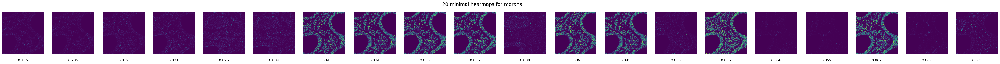

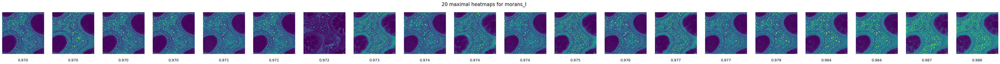

Geary's C


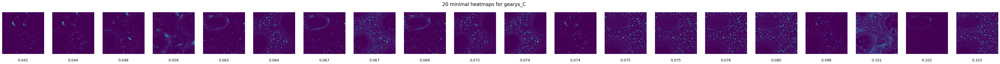

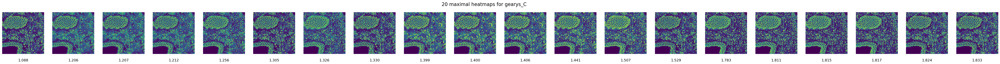

GLCM


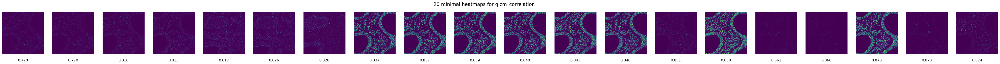

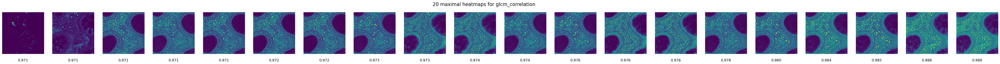

In [112]:
# Moran's I
print("Moran's I")
plot_extremal_heatmaps(arrays, "morans_I", 20)
# Geary's C
print("Geary's C")
plot_extremal_heatmaps(arrays, "gearys_C", 20)
# GLCM
print("GLCM")
plot_extremal_heatmaps(arrays, "glcm_correlation", 20)

## Correlation Matrix

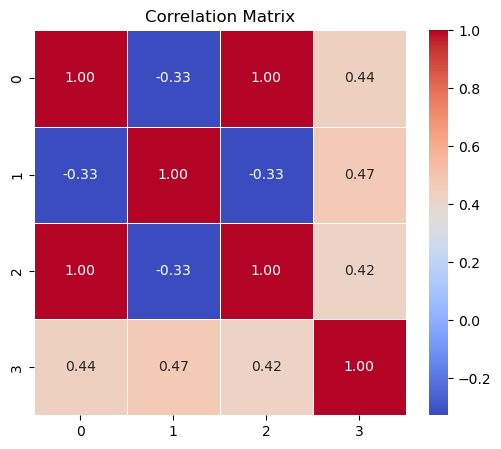

In [215]:
# Compute correlation matrix
df = spatial_df[filenames].T
corr_matrix = df.corr()

# Plot the correlation matrix
plt.figure(figsize=(6, 5))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

##  Range of Aggregation Scores

For each metric we are interested how well the capture the variety of uncertainty heatmaps present in the dataset.
Ideally, a good score should have a high range of values, indicating its ability to capture qualitative differences across heatmaps.

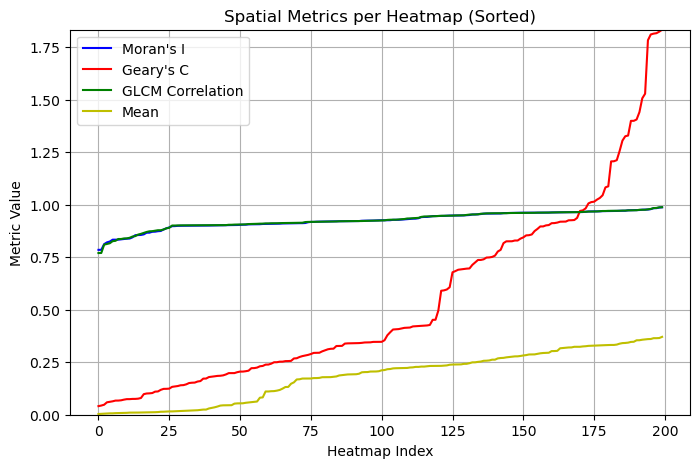

In [222]:
def sort_vals(df, method):
    geary_vals = df[df["Name"]==method].values[:,2:].tolist()[0]
    sorted_indices = np.argsort(geary_vals)  # Indices that would sort geary_vals
    sorted_values = np.array(geary_vals)[sorted_indices]  # Sort values
    return sorted_values

moran_val = sort_vals(spatial_df, "morans_I")
geary_val = sort_vals(spatial_df, "gearys_C")
glcm_val = sort_vals(spatial_df, "glcm_correlation")
mean_val = sort_vals(spatial_df, "mean")
x = [i for i, _ in enumerate(filenames)]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(x, moran_val, linestyle="-", color="b", label="Moran's I")
plt.plot(x, geary_val, linestyle="-", color="r", label="Geary's C")
plt.plot(x, glcm_val, linestyle="-", color="g", label="GLCM Correlation")
plt.plot(x, mean_val, linestyle="-", color="y", label="Mean")
# Labels, title, and legend
plt.xlabel("Heatmap Index")
plt.ylabel("Metric Value")
plt.title("Spatial Metrics per Heatmap (Sorted)")
# Get max y-value for setting the axis limits
max_y = max(max(moran_val), max(geary_val), max(glcm_val))
plt.ylim(0, max_y)  # Set y-axis range
plt.grid(True)
plt.legend(loc="upper left")  # Show legend with appropriate labels
# Show plot
plt.show()


# Counterexamples

Goal: Find heatmaps that have similar mean but different spatial correlation metrics.

In [228]:
method_names = spatial_df["Name"].tolist()
# Sort all columns based on values in the "mean" row
sorted_columns = spatial_df[filenames].loc[method_names.index("mean")].sort_values().index
# Reorder columns in reduced_df (keeping "Name" as the first column)
sorted_df = spatial_df[["Name"]+sorted_columns.tolist()]
sorted_df

,Name,instance_noise_0_nuclei_intensity_0_00_dropout_eu.npy,instance_noise_0_nuclei_intensity_0_25_dropout_eu.npy,instance_noise_0_nuclei_intensity_0_50_dropout_eu.npy,instance_noise_0_blood_cells_0_50_dropout_eu.npy,instance_noise_0_blood_cells_0_25_dropout_eu.npy,instance_noise_0_blood_cells_0_75_dropout_eu.npy,instance_noise_0_blood_cells_1_00_dropout_eu.npy,semantic_noise_0_nuclei_intensity_0_00_ensemble_eu.npy,semantic_noise_0_blood_cells_0_00_ensemble_eu.npy,...,semantic_noise_0_blood_cells_0_25_tta_pu.npy,semantic_noise_0_blood_cells_1_00_tta_pu.npy,semantic_noise_0_blood_cells_0_50_tta_au.npy,semantic_noise_0_blood_cells_1_00_tta_au.npy,semantic_noise_0_blood_cells_0_75_tta_au.npy,semantic_noise_0_blood_cells_0_75_tta_pu.npy,semantic_noise_0_blood_cells_0_00_tta_pu.npy,semantic_noise_0_blood_cells_0_25_tta_au.npy,semantic_noise_0_blood_cells_0_50_tta_pu.npy,semantic_noise_0_blood_cells_0_00_tta_au.npy
0,morans_I,0.858899,0.856183,0.866975,0.919177,0.916658,0.892203,0.908366,0.902911,0.903521,...,0.965279,0.964473,0.961876,0.961358,0.962196,0.964687,0.964456,0.960990,0.965106,0.962214
1,gearys_C,0.202554,0.205453,0.184834,0.101795,0.109960,0.153038,0.123076,0.124221,0.123341,...,0.252619,0.313979,0.378419,0.354747,0.327169,0.274968,0.252771,0.338768,0.267869,0.314544
2,glcm_correlation,0.865750,0.861351,0.873457,0.918270,0.912884,0.906676,0.909189,0.907990,0.908316,...,0.964508,0.963970,0.961290,0.961515,0.961592,0.964112,0.964309,0.960954,0.964661,0.960580
3,mean,0.003479,0.004322,0.005272,0.005749,0.006577,0.006626,0.007530,0.007881,0.007889,...,0.354492,0.354736,0.357178,0.358643,0.360107,0.360596,0.364502,0.364502,0.365234,0.370850


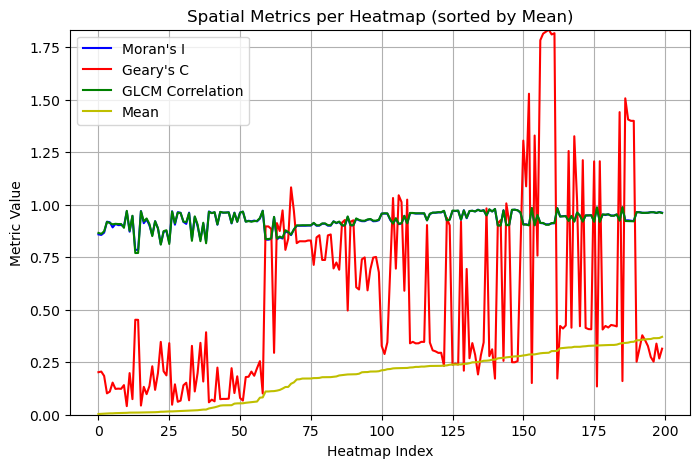

In [234]:
moran_val = list(sorted_df[sorted_columns].loc[method_names.index("morans_I")])
geary_val = list(sorted_df[sorted_columns].loc[method_names.index("gearys_C")])
glcm_val = list(sorted_df[sorted_columns].loc[method_names.index("glcm_correlation")])
mean_val = list(sorted_df[sorted_columns].loc[method_names.index("mean")])
x = [i for i, _ in enumerate(filenames)]

# Plot
plt.figure(figsize=(8, 5))
plt.plot(x, moran_val, linestyle="-", color="b", label="Moran's I")
plt.plot(x, geary_val, linestyle="-", color="r", label="Geary's C")
plt.plot(x, glcm_val, linestyle="-", color="g", label="GLCM Correlation")
plt.plot(x, mean_val, linestyle="-", color="y", label="Mean")
# Labels, title, and legend
plt.xlabel("Heatmap Index")
plt.ylabel("Metric Value")
plt.title("Spatial Metrics per Heatmap (sorted by Mean)")
# Get max y-value for setting the axis limits
max_y = max(max(moran_val), max(geary_val), max(glcm_val))
plt.ylim(0, max_y)  # Set y-axis range
plt.grid(True)
plt.legend(loc="upper left")  # Show legend with appropriate labels
# Show plot
plt.show()

We see that only Geary's C does have strong variance in values among heatmaps sharing the same mean.
Let us extract heatmaps that have minimal and maximal Geary's C while having similar mean.

In [247]:
# Find a heatmap file that has similar mean but different Geary's C
def min_max_heatmap(method):
    values = sorted_df[filenames].astype(float)
    filtered_columns = values.loc[method_names.index("mean")].between(0.3,0.33)
    selected_columns = values.columns[filtered_columns].tolist()
    selected_df = values[selected_columns]

    # Extract row with index 1
    method_row = selected_df.loc[method_names.index(method)]

    # Find column names for min and max values
    min_col = method_row.idxmin()  # Column with min value
    max_col = method_row.idxmax()  # Column with max value
    return [min_col, max_col]

min_max_heatmap("gearys_C")

['semantic_noise_0_nuclei_intensity_1_00_tta_pu.npy',
 'instance_noise_0_blood_cells_1_00_ensemble_pu.npy']

In [246]:
# Test:
minh, maxh = min_max_heatmap("gearys_C")
minh, maxh = min_max_heatmap("morans_I")

sorted_df[minh], sorted_df[maxh]

(0    0.911074
 1    1.810895
 2    0.912851
 3    0.302979
 Name: instance_noise_0_blood_cells_1_00_ensemble_au.npy, dtype: float64,
 0    0.986541
 1    0.134573
 2    0.987597
 3    0.329346
 Name: semantic_noise_0_nuclei_intensity_1_00_tta_pu.npy, dtype: float64)

Example for Geary's C


c:\Users\ckarg\.local\share\micromamba\envs\aggrouq\lib\site-packages\esda\geary.py:177: RuntimeWarning: overflow encountered in cast
  k = (yd4.sum() / n) / ((yd2.sum() / n) ** 2)
c:\Users\ckarg\.local\share\micromamba\envs\aggrouq\lib\site-packages\esda\geary.py:177: RuntimeWarning: invalid value encountered in scalar divide
  k = (yd4.sum() / n) / ((yd2.sum() / n) ** 2)
c:\Users\ckarg\.local\share\micromamba\envs\aggrouq\lib\site-packages\esda\geary.py:178: RuntimeWarning: overflow encountered in cast
  A = (n - 1) * s1 * (n2 - 3 * n + 3 - (n - 1) * k)
c:\Users\ckarg\.local\share\micromamba\envs\aggrouq\lib\site-packages\esda\geary.py:179: RuntimeWarning: overflow encountered in cast
  B = (1.0 / 4) * ((n - 1) * s2 * (n2 + 3 * n - 6 - (n2 - n + 2) * k))
c:\Users\ckarg\.local\share\micromamba\envs\aggrouq\lib\site-packages\esda\geary.py:180: RuntimeWarning: overflow encountered in cast
  C = s02 * (n2 - 3 - (n - 1) ** 2 * k)


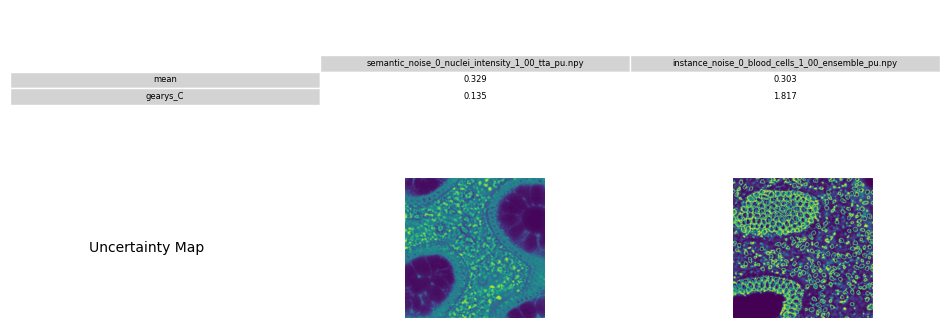

,Name,semantic_noise_0_nuclei_intensity_1_00_tta_pu.npy,instance_noise_0_blood_cells_1_00_ensemble_pu.npy
0,mean,0.329346,0.303223
1,gearys_C,0.134573,1.816911


In [249]:
# Plot heatmaps having similar mean but different spatial metric scores:

print("Example for Geary's C")
min_max_files = min_max_heatmap("gearys_C")

SLICE = 25
path = os.path.join(os.getcwd(), "data", "arctique_uq_maps")
arrays = [np.load(os.path.join(path, file)) for file in min_max_files] # 3D arrays, shape (50,512,512)
arrays = [array[SLICE,:,:] for array in arrays]
arrays = [np.where(array < 0, 0, array) for array in arrays]
unc_maps = [UncertaintyMap(array=array, name=name) for array, name in zip(arrays, min_max_files)]

strategy_list = [(am.mean, None), (am.gearys_C, None)]
summary = AggregationSummary(strategy_list, name="min_max_gearys_C")
summary.apply_methods(unc_maps, save_to_excel=False, do_plot=True, max_value=1.0)


## TODO: Analysis of Noise Levels

In [39]:
def filter_filenames(filenames, keywords):
    return [f for f in filenames if all(kw in f for kw in keywords)]

import re
def extract_noise_level(filename):
    """
    Extracts the noise level from a filename and converts it to a float.

    :param filename: String representing the filename.
    :return: Float noise level or None if not found.
    """
    match = re.search(r'_(\d+)_(\d+)_', filename)
    if match:
        return float(f"{match.group(1)}.{match.group(2)}")
    return None  # Return None if no match found
    

tta_pu_files = filter_filenames(files, ['tta', 'pu'])
tta_pu_files

['instance_noise_0_blood_cells_0_00_tta_pu.npy',
 'instance_noise_0_blood_cells_0_25_tta_pu.npy',
 'instance_noise_0_blood_cells_0_50_tta_pu.npy',
 'instance_noise_0_blood_cells_0_75_tta_pu.npy',
 'instance_noise_0_blood_cells_1_00_tta_pu.npy',
 'instance_noise_0_nuclei_intensity_0_00_tta_pu.npy',
 'instance_noise_0_nuclei_intensity_0_25_tta_pu.npy',
 'instance_noise_0_nuclei_intensity_0_50_tta_pu.npy',
 'instance_noise_0_nuclei_intensity_0_75_tta_pu.npy',
 'instance_noise_0_nuclei_intensity_1_00_tta_pu.npy',
 'semantic_noise_0_blood_cells_0_00_tta_pu.npy',
 'semantic_noise_0_blood_cells_0_25_tta_pu.npy',
 'semantic_noise_0_blood_cells_0_50_tta_pu.npy',
 'semantic_noise_0_blood_cells_0_75_tta_pu.npy',
 'semantic_noise_0_blood_cells_1_00_tta_pu.npy',
 'semantic_noise_0_nuclei_intensity_0_00_tta_pu.npy',
 'semantic_noise_0_nuclei_intensity_0_25_tta_pu.npy',
 'semantic_noise_0_nuclei_intensity_0_50_tta_pu.npy',
 'semantic_noise_0_nuclei_intensity_0_75_tta_pu.npy',
 'semantic_noise_0_nucle

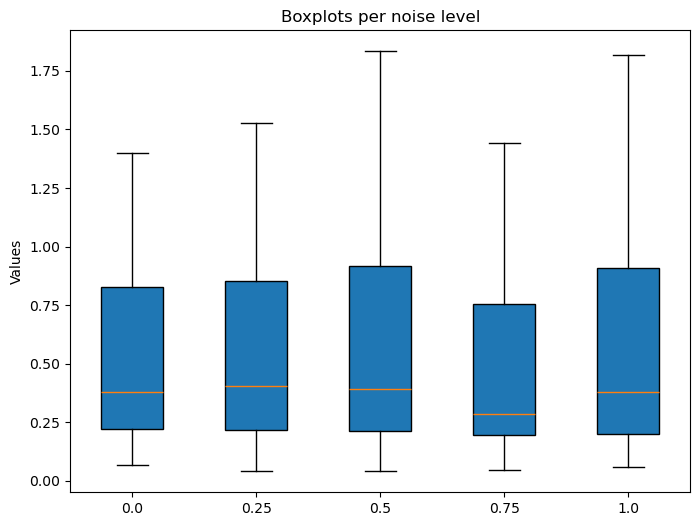

In [72]:
# Boxplot of spatial values across all noise levels

noise_levels = [0.0, 0.25, 0.5, 0.75, 1.0]#list(set([extract_noise_level(f) for f in files]))
indices_per_level = {level : [idx for idx, f in enumerate(files) if extract_noise_level(f)==level] for level in noise_levels}
indices_per_level

def values_per_level(df, level, method):
    indices = indices_per_level[level]
    #print(df[df["Name"]==method][indices].values[0])
    geary_vals = df[df["Name"]==method][indices].values[0]
    sorted_indices = np.argsort(geary_vals)  # Indices that would sort geary_vals
    sorted_values = np.array(geary_vals)[sorted_indices]  # Sort values
    return list(sorted_values)

geray_data = [values_per_level(spatial_df, level, "gearys_C") for level in noise_levels]
geray_data

# Create a boxplot
plt.figure(figsize=(8, 6))
plt.boxplot(geray_data, vert=True, patch_artist=True)

# Set labels
plt.xticks([1, 2, 3, 4, 5], [level for level in noise_levels])
plt.ylabel("Values")
plt.title("Boxplots per noise level")

# Show plot
plt.show()